# Исследование московского общепита

В ходе проекта были исследованы особенности рынка общепита Москвы:

1. распределение заведений по категориям;
2. количество посадочных мест в заведениях разных категорий;
3. соотношение сетевых и несетевых заведений;
4. количество заведений по округам;
5. средние рейтинги заведений по категориям и округам;
6. 15 улиц с наибольшим количеством заведений;
7. средний чек по округам.

## Загрузка данных

In [1]:
# импортируем нужные библиотеки
import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import plotly.express as px

In [2]:
# сохраним данные в переменную data
data = pd.read_csv('moscow_places.csv')
# выведем на экран первые строки data
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
# изучим общую информацию о data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Датафрейм содержит 8406 записей о заведениях.

Данные всех столбцов имеют соответствующий тип.

## Предобработка данных

### Пропуски

В данных имеется очень большое количество пропусков.

В столбцах `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats` пропущено больше половины значений. Однако заполнить эти пропуски значениями не представляется возможным. Удаление пропусков также невозможно, поскольку приведёт к потере большого числа данных.

### Дубликаты

In [4]:
# найдём количество строк-дубликатов
data.duplicated().sum()

0

Строк-дубликатов нет. Следует проверить неявные дубликаты по названиям и адресам.

In [5]:
# зададим функцию для приведения названий к единому формату
def clean_name(row):

    return re.sub(r'[^а-яА-ЯёЁa-zA-Z ]', '', row['name']).strip().lower()

# создадим столбец clean_name
data['clean_name'] = data.apply(clean_name, axis=1)

In [6]:
# выведем на экран дубликаты по "очищенным" названиям и адресам
data[data.duplicated(subset=['clean_name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name
599,В парке вкуснее!,кафе,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.854571,37.487254,2.2,NaN,NaN,NaN,NaN,0,NaN,в парке вкуснее
600,В парке вкуснее,кофейня,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.851985,37.478492,2.2,NaN,NaN,NaN,NaN,1,NaN,в парке вкуснее
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,more poke
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,more poke
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,раковарня клешни и хвосты
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,раковарня клешни и хвосты
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,хлеб да выпечка
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,хлеб да выпечка
4613,Cafe 13,кафе,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–19:00,55.762779,37.633079,4.3,NaN,NaN,NaN,NaN,0,200.0,cafe
4780,Cafe13,ресторан,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–18:00,55.762748,37.633176,4.3,NaN,NaN,NaN,NaN,0,200.0,cafe


In [7]:
# удалим строки с индексами 600, 1511, 2211, 3109 и 4780
data = data.drop(index=[600, 1511, 2211, 3109, 4780])
# выведем на экран оставшиеся дубликаты
data[data.duplicated(subset=['clean_name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name


Неявные дубликаты удалены.

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8401 entries, 0 to 8405
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8401 non-null   object 
 1   category           8401 non-null   object 
 2   address            8401 non-null   object 
 3   district           8401 non-null   object 
 4   hours              7866 non-null   object 
 5   lat                8401 non-null   float64
 6   lng                8401 non-null   float64
 7   rating             8401 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8401 non-null   int64  
 13  seats              4791 non-null   float64
 14  clean_name         8401 non-null   object 
dtypes: float64(6), int64(1), object(8)
memory usage: 1.0+ MB


После удаления дубликатов было потеряно 5 записей, то есть менее 0.06% от изначального числа.

In [9]:
# удалим столбец clean_name
del data['clean_name']

### Дополнительные столбцы

In [10]:
# зададим функцию для извлечения улицы из адреса
def add_street(row):

    start = row['address'].find(',')
    end = row['address'].find(',', start + 1)
    string = row['address'][start + 2:end]

    if string == 'МКАД':
        end = row['address'].rfind(',')
        return row['address'][start + 2:end]

    elif string[-5:] == 'округ':
        start = row['address'].rfind(',') + 2
        return row['address'][start:]

    else:
        return string

# создадим столбец street с названиями улиц
data['street'] = data.apply(add_street, axis=1)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [11]:
# создадим столбец is_24_7
data['is_24_7'] = data['hours'] == 'ежедневно, круглосуточно'
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


## Исследование рынка общепита Москвы

### Распределение заведений по категориям

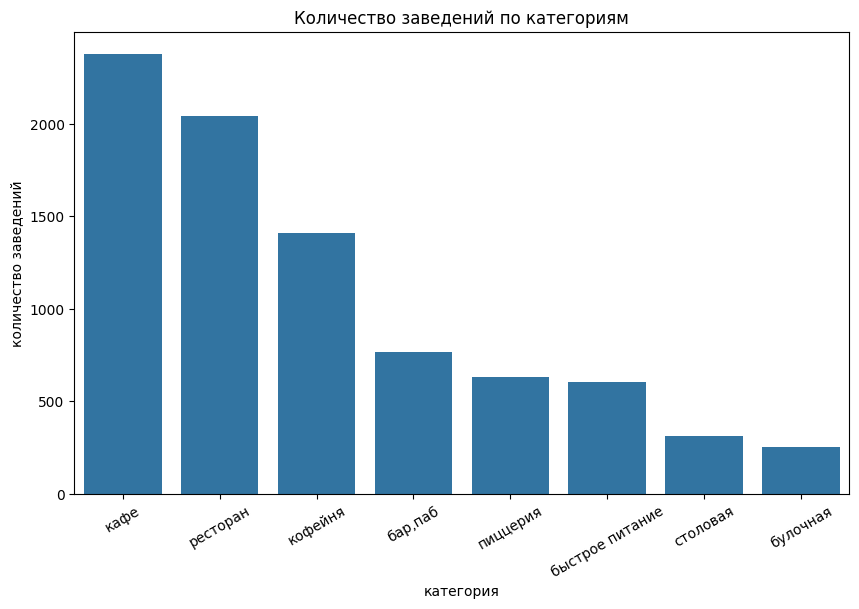

In [12]:
# найдём количество заведений по категориям и построим график
cats_amt = data.groupby(['category'], as_index=False)['name'].count().sort_values(by='name', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='name', data=cats_amt)

plt.title('Количество заведений по категориям')
plt.xlabel('категория')
plt.ylabel('количество заведений')
plt.xticks(rotation=30)
plt.show()

Среди заведений больше всего кафе, ресторанов и кофеен. Также в данных представлены бары, пиццерии, заведения быстрого питания, столовые и булочные.

In [13]:
# построим круговую диаграмму распределения заведений по категориям
vals = data.groupby('category', as_index=False)['name'].count()

px.pie(names=vals['category'], values=vals['name'], title='Доля заведений по категориям')

Кафе, рестораны и кофейни вместе составляют больше половины заведений.

### Количество посадочных мест по категориям

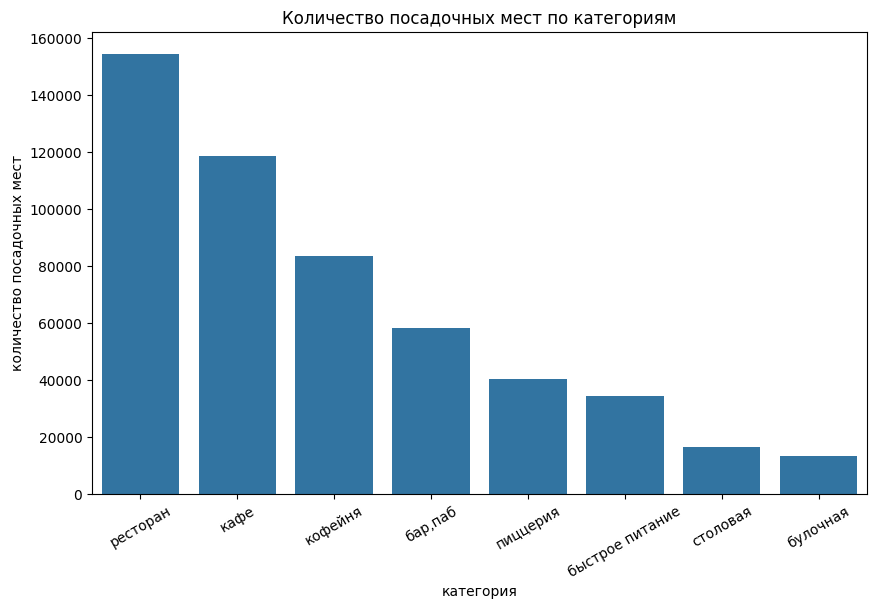

In [14]:
# построим столбчатую диаграмму распределения количества посадочных мест по категориям заведений
seats_cats = data.groupby('category', as_index=False)['seats'].sum().sort_values(by='seats', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='seats', data=seats_cats)

plt.title('Количество посадочных мест по категориям')
plt.xlabel('категория')
plt.ylabel('количество посадочных мест')
plt.xticks(rotation=30)
plt.show()

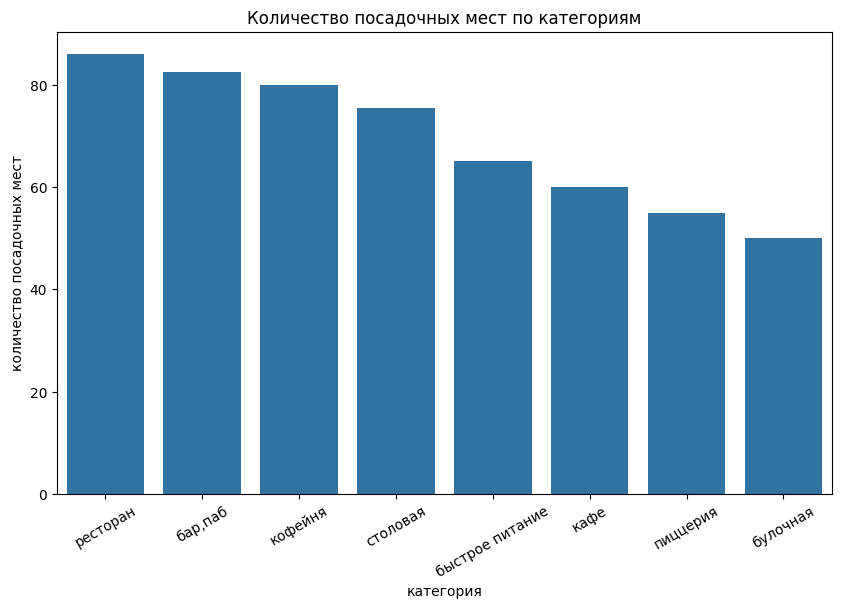

In [15]:
# построим столбчатую диаграмму распределения количества посадочных мест по категориям заведений
seats_cats_md = data.groupby('category', as_index=False)['seats'].median().sort_values(by='seats', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='seats', data=seats_cats_md)

plt.title('Количество посадочных мест по категориям')
plt.xlabel('категория')
plt.ylabel('количество посадочных мест')
plt.xticks(rotation=30)
plt.show()

Наибольшее общее количество посадочных мест - в ресторанах и кафе.

Наибольшее медианное количество посадочных мест - в ресторанах, барах, кофейнях и столовых.

### Соотношение сетевых и несетевых заведений

In [16]:
# построим круговую диаграмму соотношения сетевых и несетевых заведений
vals = data.groupby('chain')['name'].count()
labels = ["Несетевые", "Сетевые"]

px.pie(names=labels, values=vals, title='Соотношение сетевых и несетевых заведений')

Больше половины заведений не являюся сетевыми.

### Соотношение сетевых и несетевых заведений по категориям

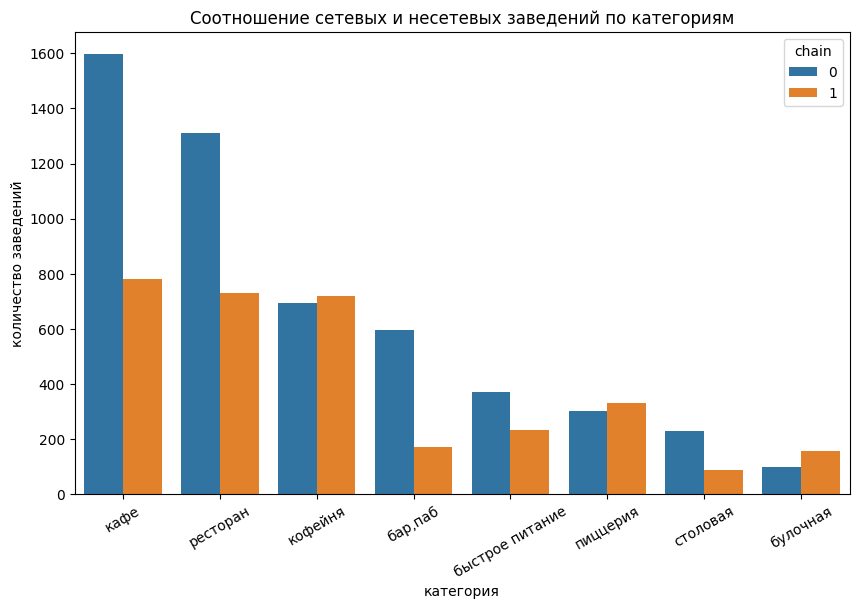

In [17]:
# найдём соотношение сетевых и несетевых заведений в каждой категории и построим столбчатую диаграмму
cats_chn = data.groupby(['category', 'chain'], as_index=False)['name'].count()
cats_chn = cats_chn.sort_values(by='name', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='name', hue='chain', data=cats_chn)

plt.title('Соотношение сетевых и несетевых заведений по категориям')
plt.xlabel('категория')
plt.ylabel('количество заведений')
plt.xticks(rotation=30)
plt.show()

Подавляющее большинство кафе, ресторанов, баров и столовых не являются сетевыми.

Сетевые заведения преобладают среди кофеен, пиццерий и булочных.

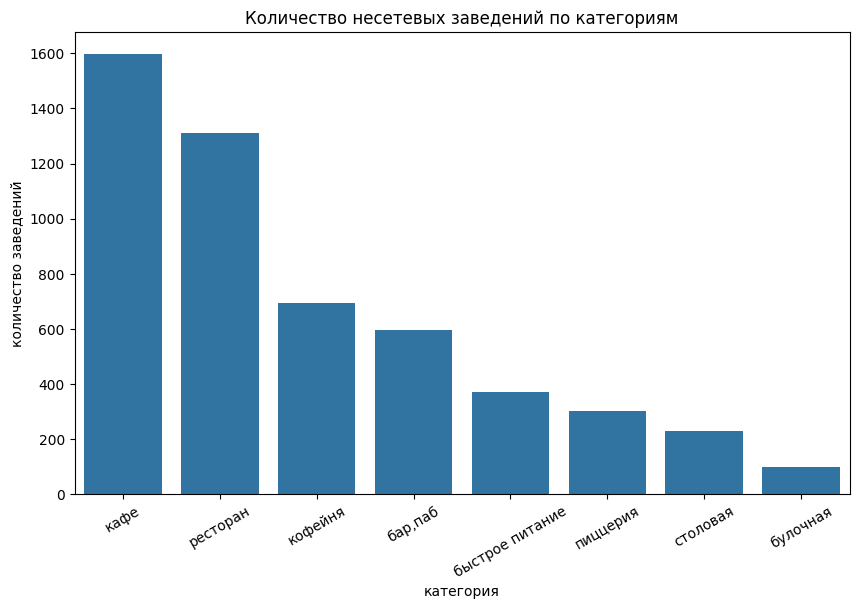

In [18]:
# построим столбчатую диаграмму распределения несетевых заведений по категориям
plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='name', data=cats_chn[cats_chn['chain'] == 0])

plt.title('Количество несетевых заведений по категориям')
plt.xlabel('категория')
plt.ylabel('количество заведений')
plt.xticks(rotation=30)
plt.show()

Среди несетевых заведений больше всего кафе и ресторанов.

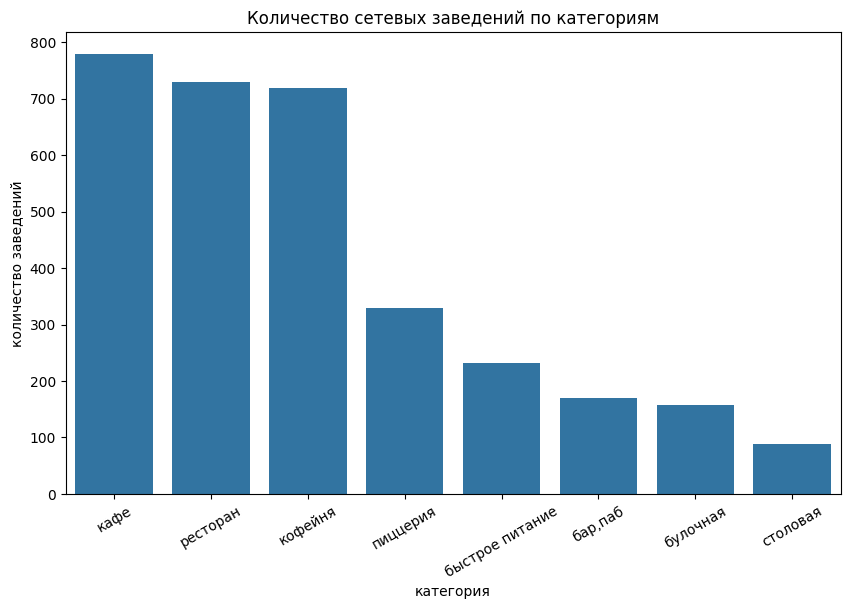

In [19]:
# построим столбчатую диаграмму распределения сетевых заведений по категориям
plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='name', data=cats_chn[cats_chn['chain'] == 1])

plt.title('Количество сетевых заведений по категориям')
plt.xlabel('категория')
plt.ylabel('количество заведений')
plt.xticks(rotation=30)
plt.show()

Среди сетевых заведений больше всего кафе, ресторанов и кофеен.

### 15 самых популярных сетей

In [20]:
# найдём 15 самых популярных сетей и категории их заведений
names = data.loc[data['chain'] == 1].groupby(['name', 'category'], as_index=False)['address'].count()
names.columns = ['name', 'category', 'amount']
names = names.sort_values(by='amount', ascending=False)
names = names.head(15)

In [21]:
# построим столбчатую диаграмму количества заведений самых популярных сетей
fig = px.bar(names, x='name', y='amount', color='category', title='Количество заведений самых популярных сетей')
fig.show()

Среди самых популярных сетей больше всего кофеен.

### Количество заведений по округам

In [22]:
# найдём количество заведений каждой категории по административным округам
districts_cats = data.groupby(['district', 'category'], as_index=False)['name'].count()
districts_cats.columns = ['district', 'category', 'amount']
districts_cats = districts_cats.sort_values(by='amount', ascending=False)

In [23]:
# построим столбчатую диаграмму распределения заведений каждой категории по административным округам
fig = px.bar(districts_cats, x='district', y='amount', color='category', title='Количество заведений по АО')
fig.show()

Больше всего заведений в Центральном АО. Среди заведений в этом АО преобладают рестораны, кофейни, кафе и бары. В других АО кофейни и бары занимают меньшую долю.

### Рейтинги заведений по категориям

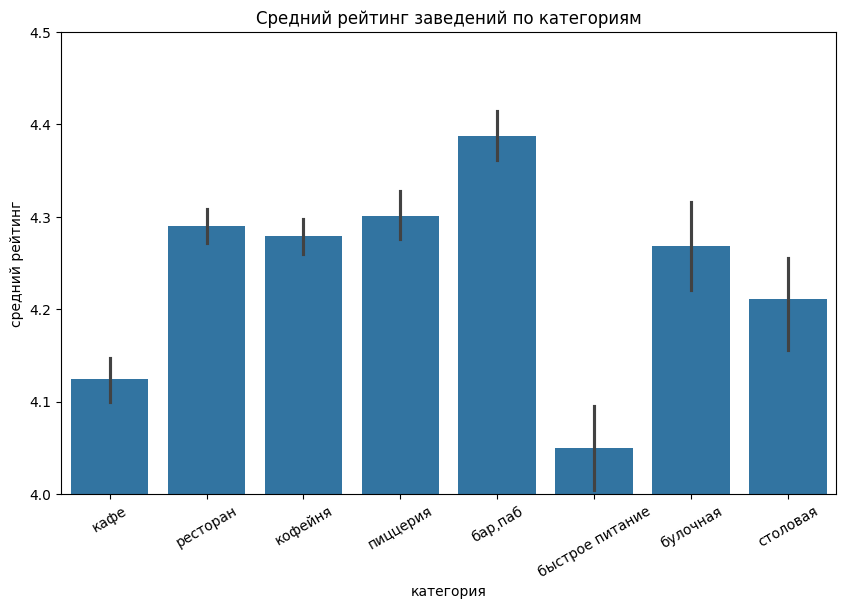

In [24]:
# построим столбчатую диаграмму средниего рейтинга заведений по категориям
plt.figure(figsize=(10, 6))
sns.barplot(x='category', y='rating', data=data)

plt.ylim(4, 4.5)
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('категория')
plt.ylabel('средний рейтинг')
plt.xticks(rotation=30)
plt.show()

Все средние рейтинги заведений укладываются в промежуток между 4 и 4.5 баллами. Наибольший средний рейтинг у баров, наименьший - у заведений быстрого питания. Это может быть связано с тем, что заведениям быстрого питания редко ставят оценки.

### Рейтинги заведений по округам

In [25]:
# найдём средний рейтинг заведений по административным округам
distr_avg_rat = data.groupby('district', as_index=False)['rating'].mean()
distr_avg_rat

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.242094
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377555
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [ ]:
# визуализируем средние рейтинги заведений по административным округам
m1 = Map(location=[55.751244, 37.618423], tiles='Cartodb Positron')

Choropleth(
    geo_data='admin_level_geomap.geojson',
    data=distr_avg_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний рейтинг по округам').add_to(m1)

m1

Наибольший средний рейтинг у заведений Центрального АО, наименьший - у заведений Юго-Восточного АО.

### Заведения на карте

In [28]:
# нанесём заведения на карту с помощью кластеров
m2 = Map(location=[55.751244, 37.618423], tiles='Cartodb Positron')

marker_cluster = MarkerCluster().add_to(m2)

def create_clusters(row):
    Marker([row['lat'], row['lng']], popup=row['name']).add_to(marker_cluster)

data.apply(create_clusters, axis=1)
m2


<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Карта с кластерами добавлена корректно!
</div>

### 15 улиц с наибольшим количеством заведений

In [29]:
# найдём 15 улиц с наибольшим количеством заведений
streets = data.groupby('street', as_index=False)['name'].count().sort_values(by='name', ascending=False)
streets = streets.head(15)
streets.columns = ['street', 'amount']
streets = streets.merge(data, on='street', how='left')
streets = streets.groupby(['street', 'category'], as_index=False)['name'].count()
streets.columns = ['street', 'category', 'amount']
streets = streets.sort_values(by='amount', ascending=False)

In [30]:
fig = px.bar(streets, x='street', y='amount', color='category', title='Количество заведений по улицам')
fig.show()

Наибольшее количество заведений - на проспекте Мира, Профсоюзной улице, проспекте Вернадского и Ленинском проспекте.

### Улицы с одним заведением

In [31]:
# найдём улицы с одним заведением
strs = data.groupby(['street', 'district'], as_index=False)['name'].count()
strs[strs['name'] == 1]

,street,district,name
0,1-й Автозаводский проезд,Южный административный округ,1
1,1-й Балтийский переулок,Северный административный округ,1
2,1-й Варшавский проезд,Южный административный округ,1
3,1-й Вешняковский проезд,Юго-Восточный административный округ,1
5,1-й Голутвинский переулок,Центральный административный округ,1
...,...,...,...
1562,улица Шкулёва,Юго-Восточный административный округ,1
1563,улица Шкулёва,Юго-Восточный административный округ,1
1565,улица Шухова,Южный административный округ,1
1568,улица Юннатов,Северный административный округ,1


In [32]:
# количество улиц с одним заведением по административным округам
d = strs.groupby('district', as_index=False)['street'].count()
# построим круговую диаграмму распределения сетевых заведений по категориям
px.pie(names=d['district'], values=d['street'], title='Распределение улиц с одним заведением по округам')

Больше всего улиц с одним заведением приходится на Центральный АО.

### Средний чек по округам

In [33]:
# найдём медианный средний чек по административным округам
distr_avg_bill = data.groupby('district', as_index=False)['middle_avg_bill'].median()
distr_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [35]:
# визуализируем медианный средний чек по административным округам
m3 = Map(location=[55.751244, 37.618423], tiles='Cartodb Positron')

Choropleth(
    geo_data='admin_level_geomap.geojson',
    data=distr_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний чек по округам').add_to(m3)

m3

Наибольший средний чек у заведений Центрального и Западного АО, наименьший - у заведений Восточного, Южного и Северо-Восточного АО.

### Вывод

В результате анализа данных можно сделать следующие выводы:

1. Среди заведений больше всего кафе, ресторанов и кофеен. Вместе они составляют больше половины заведений.

2. Рестораны и кафе имеют больше всего посадочных мест. Наибольшее медианное количество посадочных мест - в ресторанах, барах, кофейнях и столовых.

3. Больше половины заведений не являюся сетевыми. Наибольший перевес несетевых заведений характерен для кафе, ресторанов, баров и столовых.

4. Среди несетевых заведений больше всего кафе и ресторанов. Среди сетевых заведений больше всего кафе, ресторанов и кофеен.

5. Среди самых популярных сетей больше всего кофеен.

6. Все средние рейтинги заведений укладываются в промежуток между 4 и 4.5 баллами. Наибольший средний рейтинг у баров, наименьший - у заведений быстрого питания.

7. Наибольший средний рейтинг у заведений Центрального АО, наименьший - у заведений Юго-Восточного АО.

8. Больше всего улиц с одним заведением приходится на Центральный АО.

9. Наибольший средний чек у заведений Центрального и Западного АО, наименьший - у заведений Восточного, Южного и Северо-Восточного АО.

## Исследование кофеен

### Кофейни

In [36]:
# создадим отдельный датафрейм с кофейнями
coffeehouses = data[data['category'] == 'кофейня']
# выведем общую информацию о нём
coffeehouses.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1412 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1412 non-null   object 
 1   category           1412 non-null   object 
 2   address            1412 non-null   object 
 3   district           1412 non-null   object 
 4   hours              1397 non-null   object 
 5   lat                1412 non-null   float64
 6   lng                1412 non-null   float64
 7   rating             1412 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1412 non-null   int64  
 13  seats              751 non-null    float64
 14  street             1412 non-null   object 
 15  is_24_7            1412 non-null   bool   
dtypes: bool(1), float64(6), int64

Всего в данных 1412 кофеен.

### Количество кофеен по округам

In [37]:
# найдём количество кофеен по административным округам
distr_ch = coffeehouses.groupby('district', as_index=False)['name'].count()

In [39]:
# визуализируем количество кофеен по административным округам
m4 = Map(location=[55.751244, 37.618423], tiles='Cartodb Positron')

Choropleth(
    geo_data='admin_level_geomap.geojson',
    data=distr_ch,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Количество кофеен по округам').add_to(m4)

m4

Наибольшее количество кофеен - в Центральном АО, наименьшее - в Восточном, Юго-Восточном, Юго-Западном и Северо-Западном АО.

### Круглосуточные кофейни

In [40]:
# найдём количество круглосуточных кофеен
coffeehouses[coffeehouses['is_24_7'] == 'True']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


Круглосуточных кофеен в данных нет.

### Средние рейтинги кофеен по округам

In [41]:
# найдём средние рейтинги кофеен по административным округам
distr_rt = coffeehouses.groupby('district', as_index=False)['rating'].mean()

In [43]:
# визуализируем средние рейтинги кофеен по административным округам
m5 = Map(location=[55.751244, 37.618423], tiles='Cartodb Positron')

Choropleth(
    geo_data='admin_level_geomap.geojson',
    data=distr_rt,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Рейтинги по округам').add_to(m5)

m5

Наибольшие рейтинги - у кофеен в Центральном и Северо-Западном АО, наименьшие - в Северо-Восточном и Западном  АО.

### Цена чашки кофя

<ipython-input-44-caaef55d26f1>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




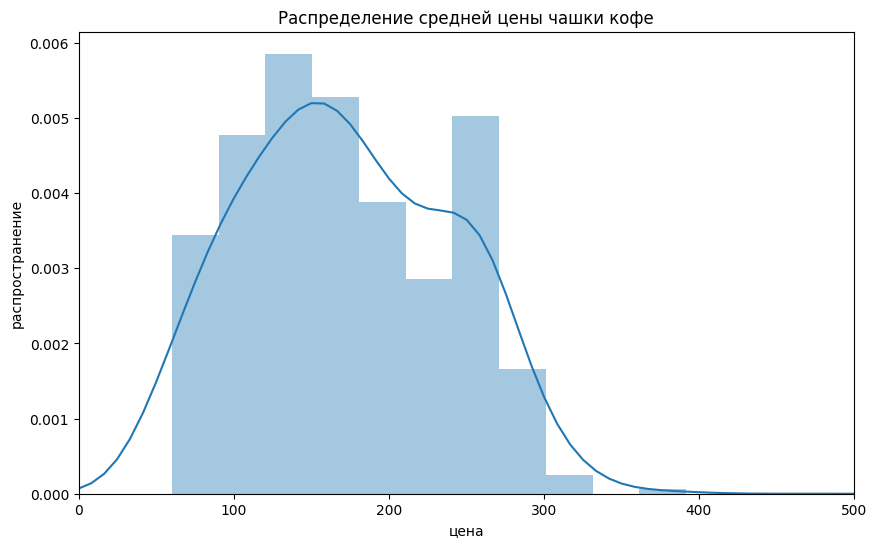

In [44]:
# построим график распределения цены чашки кофе
plt.figure(figsize=(10, 6))
sns.distplot(coffeehouses['middle_coffee_cup'])
plt.xlim(0, 500)
plt.title('Распределение средней цены чашки кофе')
plt.xlabel('цена')
plt.ylabel('распространение')
plt.show()

Наиболее распространённая стимость чашки кофе - около 130 рублей.

In [45]:
# найдём среднюю цену чашки кофе по административным округам
distr_pr = coffeehouses.groupby('district', as_index=False)['middle_coffee_cup'].mean()

In [46]:
# визуализируем среднюю цену чашки кофе по административным округам
m6 = Map(location=[55.751244, 37.618423], tiles='Cartodb Positron')

Choropleth(
    geo_data='admin_level_geomap.geojson',
    data=distr_pr,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='Purples',
    fill_opacity=0.8,
    legend_name='Цена кофе по округам').add_to(m6)

m6

Наибольшая средняя стимость чашки кофе - в Центральном, Западном и Юго-Западном АО.

### Вывод

Наиболее целесообразным представляется открыть кофейню в АО, удовлетворяющем следующим критериям:

1. в данном АО не очень большое количество кофеен,
2. в данном АО низкий средний рейтинг кофеен,
3. в данном АО высокая средняя цена чашки кофе.

Примером может служить Западный АО.

## Презентация

Презентация: <https://drive.google.com/file/d/1ICSJ3-ahBnyikN480IzDShRhpj9hv3xU/view?usp=sharing>